# 

In [1]:
import cv2
import matplotlib.pyplot as plt
import hashlib
import numpy as np
def getmd5(filename):
    file_txt = open(filename,'rb').read()
    m = hashlib.md5(file_txt)
    return m.hexdigest()
def guidedFilter(img_path,gpath):
    img = cv2.imread(img_path)
    gimg = cv2.imread(gpath)
#     cv2.imshow('orignal image',img)
    b, g, r = cv2.split(img)#cv2默认读取图像通道顺序为BGR
    img = cv2.merge([r, g, b])
    print(hashlib.md5(img))
#     print(type(img),img.shape)
    plt.figure(figsize=(img.shape[0]/50, img.shape[1]/50))
    plt.imshow(img)
    plt.show()
#     dst = cv2.ximgproc.guidedFilter(gimg,img,60,0.1)
    dst = cv2.ximgproc.guidedFilter(img,img,60,1000)

#     print(hashlib.md5(dst))
    plt.figure(figsize=(dst.shape[0]/50, dst.shape[1]/50))
    plt.imshow(dst)
    plt.show()

img_path=r'/home/cver/lcx/Part_Classification/HPT/burn-BR20160016-1.png'
gpath=r'/home/cver/lcx/Part_Classification/HPT/burn-BR20160016-0.png'
# guidedFilter(img_path,img_path)

In [2]:
import cv2
import matplotlib.pyplot as plt
import hashlib
import numpy as np

def cv_filter2d(img_path):
    src = cv2.imread(img_path)
    b, g, r = cv2.split(src)
    src = cv2.merge([r, g, b])
    kernel = np.array([[0, -1, 0],
                       [-1, 5, -1],
                       [0, -1, 0]])

    dst = cv2.filter2D(src, -1, kernel)

#     print(hashlib.md5(img))
#     print(type(img),img.shape)
    plt.figure(figsize=(src.shape[0]/50, src.shape[1]/50))
    plt.imshow(src)
    plt.show()
    
    plt.figure(figsize=(dst.shape[0]/50, dst.shape[1]/50))
    plt.imshow(dst)
    plt.show()

img_path = r"/home/cver/lcx/Part_Classification/HPT/burn-BR20160016-1.png"
# cv_filter2d(img_path)


In [1]:
import cv2,os
import matplotlib.pyplot as plt
import hashlib
import numpy as np
from pathlib import Path
from skimage.filters import threshold_yen
from skimage.exposure import rescale_intensity
from skimage.io import imread, imsave
from tqdm import tqdm
from PIL import Image
img_path=r'/home/cver/20200702_FREEZED_DATA/ENGINE_DATA/pre_treat/RGBA_BLACK_EDGE/part_unknown/test-crack-BR2012267-6.png'
gpath=r'/home/cver/lcx/Part_Classification/HPT/burn-BR20160016-0.png'
path=Path(r'/home/cver/lcx/Part_Classification/HPT')
# path = Path(r'/home/cver/lcx/DexiNed/result')
# path_list = [i for i in path.glob('*[!.json]')][:5]
# path_list = [r'/home/cver/docker-data/maskrcnn-lcx/cxtest2/temp/{D2B636F9-6DBC-48E2-910C-DB476828A91E}.png.jpg']
path_list = [r'/home/cver/20200702_FREEZED_DATA/ENGINE_DATA/HPTN/burn-BR20161843-0.png',
            r'/home/cver/20200702_FREEZED_DATA/ENGINE_DATA/CC/CFM5600010054_CC_Outer liner_Axial cracks_70059.jpg',
            r'/home/cver/20200702_FREEZED_DATA/ENGINE_DATA/CC/CFM5600010476_CC_Inner Liner_Axial cracks_90481.jpg',
            r'/home/cver/20200702_FREEZED_DATA/ENGINE_DATA/CC/CFM5600010476_CC_Outer liner_Axial cracks_90489.jpg',
            ]
def showimg(img1,img2):#按一行两列的格式输出图像，适合jupyter界面
#     plt.figure(figsize=(img.shape[0]/50, img.shape[1]/50))
    plt.figure(figsize=(img1.shape[0]/10, img1.shape[1]/10))
    plt.subplot(1,2,1)
    plt.axis('off');plt.imshow(img1, cmap ='gray')
    plt.subplot(1,2,2)
    plt.axis('off');plt.imshow(img2, cmap ='gray')
    plt.show()
def loadimg(img_path):
    return imread(img_path)
def yen(img):#适合处理扫描件，提升图像亮度和细节https://scikit-image.org/docs/dev/api/skimage.filters.html#threshold-yen
    yen_threshold = threshold_yen(img)
    bright = rescale_intensity(img, (0, yen_threshold), (0, 255))
    return bright
def clahe(img):#限制对比度自适应直方图均衡(Contrast Limited Adaptive Histogram Equalization），适合去雾、提升饱和度对比度
    lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    lab_planes = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=2.0,tileGridSize=(8,8))
    lab_planes[0] = clahe.apply(lab_planes[0])
    lab = cv2.merge(lab_planes)
    dst = cv2.cvtColor(lab, cv2.COLOR_LAB2BGR)
    return dst
def bm3d(img):#####有专利限制
    dst = cv2.xphoto.bm3dDenoising(img)
    return dst
def mean(img,_mean):#减均值后，图像的背景部分会变白，这是叫‘白化（whiten）’吗
#     print(type(img),img.dtype)
    sub_img = np.zeros(shape=img.shape, dtype=np.uint8)
#     mean = [95,92,86]
#     mean = [103,116,128]
    sub_img[:,:,0] += _mean[0]
    sub_img[:,:,1] += _mean[1]
    sub_img[:,:,2] += _mean[2]
    return sub_img
def gray(img):
    grayed = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    rgb_grayed = cv2.cvtColor(grayed, cv2.COLOR_GRAY2RGB)
    return rgb_grayed
def single_channal(img,c):
    z_img = np.zeros(shape=img.shape, dtype=np.uint8)
    z_img[:,:,c] = img[:,:,c]
    print('z_img:',z_img.shape)
    return z_img
def save_img(src,dst,do_fun):
    for i in tqdm(src.glob('*')):
        img = imread(i)
        result = do_fun(img)
        imsave(dst/i.name,result)
def applyCustomColorMap(im_gray) :    
        lut = np.zeros((256, 1, 3), dtype=np.uint8)    
        #Red channel
        lut[:, 0, 0] = [54,55,56,57,57,58,59,60,61,62,62,63,64,65,66,67,67,68,69,70,71,72,72,73,74,75,76,77,78,78,79,80,81,82,83,83,84,85,86,87,88,88,89,90,91,92,93,93,94,95,96,97,98,98,99,100,101,102,103,103,104,105,106,107,108,110,112,114,116,118,119,121,123,125,127,129,131,133,135,137,139,141,143,145,146,148,150,152,154,156,158,160,162,164,166,168,170,171,173,175,177,179,181,183,185,187,189,191,193,195,197,198,200,202,204,206,208,210,212,214,216,218,220,222,224,225,227,229,230,231,231,232,232,232,233,233,234,234,234,235,235,236,236,236,237,237,238,238,238,239,239,240,240,240,241,241,242,242,242,243,243,244,244,244,245,245,246,246,246,247,247,248,248,248,249,249,250,250,250,251,251,252,252,252,253,253,254,254,254,255,255,255,255,255,255,255,255,255,255,255,255,255,255,255,255,255,255,255,255,255,255,255,255,255,255,255,255,255,255,255,255,255,255,255,255,255,255,255,255,255,255,255,255,255,255,255,255,255,255,255,255,255,255,255,255,255,255,255,255,255,255,255,255,255,255,255]       
        #Green channel
        lut[:, 0, 1] = [55,56,56,57,58,59,59,60,61,62,63,63,64,65,66,66,67,68,69,69,70,71,72,72,73,74,75,75,76,77,78,79,79,80,81,82,82,83,84,85,85,86,87,88,88,89,90,91,92,92,93,94,95,95,96,97,98,98,99,100,101,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,168,168,168,168,168,168,168,168,168,168,168,168,168,168,168,168,167,167,167,167,167,167,167,167,167,167,167,167,167,167,167,167,166,166,166,166,166,166,166,166,166,166,166,166,166,166,166,166,166,165,165,165,165,165,165,165,165,165,165,165,165,165,165,165,164,162,161,160,158,157,156,154,153,152,150,149,148,146,145,144,142,141,140,138,137,136,134,133,132,130,129,128,126,125,124,122,121,120,118,117,116,114,113,112,110,109,108,106,105,104,102,101,100,98,97,96,94,93,92,90,89,88,86,85,84,82,81,80]
        #Blue channel
        lut[:, 0, 2] = [54,55,56,56,57,58,59,60,60,61,62,63,64,64,65,66,67,67,68,69,70,71,71,72,73,74,75,75,76,77,78,79,79,80,81,82,82,83,84,85,86,86,87,88,89,90,90,91,92,93,93,94,95,96,97,97,98,99,100,101,101,102,103,104,104,105,105,105,105,105,105,106,106,106,106,106,106,107,107,107,107,107,107,108,108,108,108,108,108,109,109,109,109,109,109,110,110,110,110,110,110,111,111,111,111,111,111,112,112,112,112,112,113,113,113,113,113,113,114,114,114,114,114,114,115,115,115,115,115,115,115,116,116,116,116,116,116,116,117,117,117,117,117,117,117,117,118,118,118,118,118,118,118,119,119,119,119,119,119,119,119,120,120,120,120,120,120,120,121,121,121,121,121,121,121,121,122,122,122,122,122,122,122,123,123,123,123,123,123,123,123,124,122,120,118,116,114,112,111,109,107,105,103,101,99,97,95,93,91,89,87,85,83,81,80,78,76,74,72,70,68,66,64,62,60,58,56,54,52,50,48,47,45,43,41,39,37,35,33,31,29,27,25,23,21,19,17,16,14,12,10,8,6,4,2,0]
        im_color = cv2.LUT(im_gray, lut)
        return im_color
def guidedFilter(img,radius=1,sigma=1000): #向导滤波
    dst = cv2.ximgproc.guidedFilter(img,img,radius,sigma)
    return dst    
def canny(img,smooth=25,contrast=25):
    w_edge = cv2.Canny(img,smooth,contrast)
    white =  255 * np.ones(img.shape[:2],dtype=np.uint8)
    b_edge = white - w_edge    
    return b_edge
def equalizeHist_in_3channels(img):
    temp = np.zeros(shape=img.shape, dtype=np.uint8)
    temp[:,:,0] = cv2.equalizeHist(img[:,:,0])
    temp[:,:,1] = cv2.equalizeHist(img[:,:,1])
    temp[:,:,2] = cv2.equalizeHist(img[:,:,2])
    return temp
def clahe_in_3channels(img, clipLimit=2.0, tileGridSize=(8,8)):
    temp = np.zeros(shape=img.shape, dtype=np.uint8)
    clahe = cv2.createCLAHE(clipLimit, tileGridSize)
    temp[:,:,0] = clahe.apply(img[:,:,0])
    temp[:,:,1] = clahe.apply(img[:,:,1])
    temp[:,:,2] = clahe.apply(img[:,:,2])
    return temp
def guidedFilter_in_3channels(img,radius=1,sigma=1000):
    temp = np.zeros(shape=img.shape, dtype=np.uint8)
    temp[:,:,0] = cv2.ximgproc.guidedFilter(img[:,:,0],img[:,:,0],radius,sigma) # (orig_img, guide_img, filter_radius, filter_sigma)
    temp[:,:,1] = cv2.ximgproc.guidedFilter(img[:,:,1],img[:,:,1],radius,sigma)
    temp[:,:,2] = cv2.ximgproc.guidedFilter(img[:,:,2],img[:,:,2],radius,sigma)
    return temp
# print(path_list)
for i in path_list:
    img = loadimg(i)
    dst1 = clahe(img)
#     dst2 = equalizeHist_in_3channels(img)
    dst2 = clahe_in_3channels(img,clipLimit=2.0, tileGridSize=(4,4))
#     dst2 = equalizeHist_in_3channels(img)
    dst3 = clahe_in_3channels(guidedFilter_in_3channels(img),clipLimit=8.0, tileGridSize=(2,2))
#     dst4 = guidedFilter(clahe_in_3channels(img))
    dst4 = guidedFilter_in_3channels(dst3)
    # showimg(img,dst3)
#     showimg(img,dst2)
# save_img(src,dst,guidedFilter)

AttributeError: module 'cv2.cv2' has no attribute 'ximgproc'

In [122]:
from pathlib import Path#修改四通道图像对应的json 'imagePath' 后缀，尺寸统一为752x576
import json
focus_part = ['CC', 'HPC', 'HPT', 'HPTN', 'LPTN', 'normal_HPT', 'normal_LPT', 'part_unknown']
orig_path = Path(r'/home/cver/20200702_FREEZED_DATA/ENGINE_DATA')
dst = Path(r'/home/cver/20200702_FREEZED_DATA/ENGINE_DATA/pre_treat/GF_Canny_BLACK_EDGE')

for part in tqdm(focus_part):
    orig_part = orig_path/part
    dst_part = dst/part
    for j in orig_part.glob('*.json'):
        with open(j,'r') as fp:
            data = json.load(fp)
            data['imagePath'] = str(Path(data['imagePath']).with_suffix('.png'))
            data['imageHeight'] = 576
            data['imageWidth'] = 752
        json.dump(data, open(dst_part/j.name, 'w'), indent=4, ensure_ascii=False)


100%|██████████| 8/8 [00:19<00:00,  2.49s/it]


In [123]:
import numpy as np
from pathlib import Path
from skimage.io import imread, imsave
from tqdm import tqdm
from PIL import Image
def merge_rgb_edge(rgb,edge):# 输入Image.open对象
    rgb = np.array(rgb.resize((752,576)))
    edge = np.array(edge.resize((752,576)))
#     white = 255 * np.ones((576,752),dtype=np.uint8)
#     edge = white - edge
    rgbe = np.zeros((576,752,4),dtype=np.uint8)
    rgbe[:, :, 0] = rgb[:, :, 0]
    rgbe[:, :, 1] = rgb[:, :, 1]
    rgbe[:, :, 2] = rgb[:, :, 2]
    rgbe[:, :, 3] = edge
    rgbe = Image.fromarray(rgbe)
    return rgbe

focus_part = ['CC', 'HPC', 'HPT', 'HPTN', 'LPTN', 'normal_HPT', 'normal_LPT', 'part_unknown']
edge_path = Path(r'/home/cver/20200702_FREEZED_DATA/ENGINE_DATA/pre_treat/GF_DN_contour')
orig_path = Path(r'/home/cver/20200702_FREEZED_DATA/ENGINE_DATA')
dst = Path(r'/home/cver/20200702_FREEZED_DATA/ENGINE_DATA/pre_treat/GF_DN_RGBA')

for part in tqdm(focus_part):
    edge_part = edge_path/part
    orig_part = orig_path/part
    dst_part = dst/part
    edge_img = sorted([e for e in edge_part.glob('*[!.json]')], key=lambda s: s.stem)#sort by img stem name
    orig_img = sorted([o for o in orig_part.glob('*[!.json]')], key=lambda s: s.stem)

    for e,o in zip(edge_img, orig_img):
        if not e.stem == o.stem:
            print(f'image name not match in {e} and {o}')
        edge = Image.open(e);orig = Image.open(o)
        rgbe = merge_rgb_edge(orig,edge)
#         if isinstance(rgbe,(Image.Image)):
#             print('is instance')
#         print(type(rgbe))
        rgbe.save(dst_part/e.name, 'png')

100%|██████████| 8/8 [03:01<00:00, 22.71s/it]


  0%|          | 0/1 [00:00<?, ?it/s]

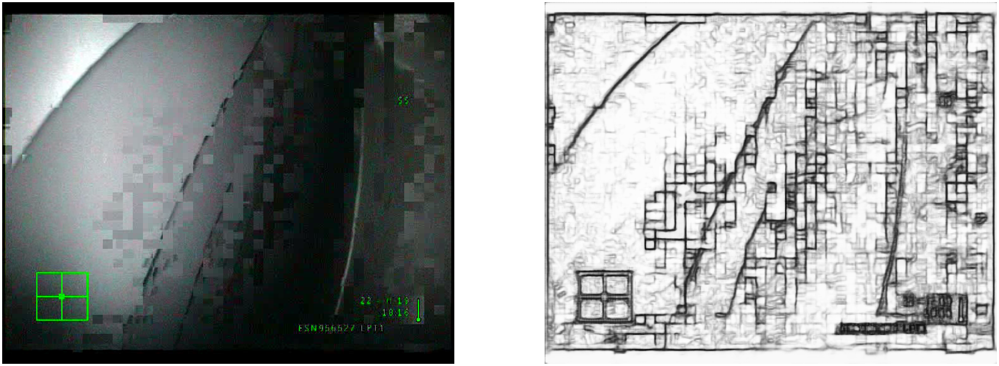

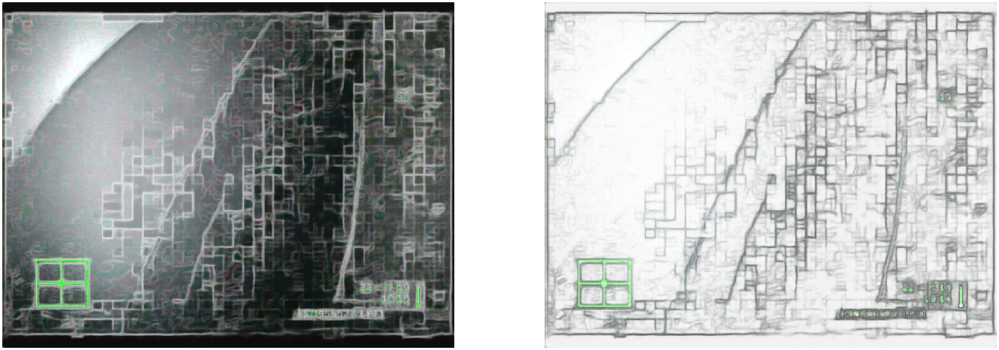

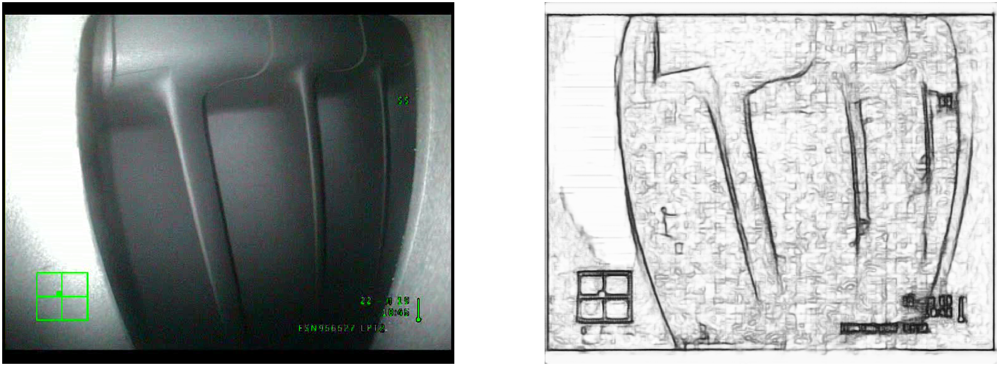

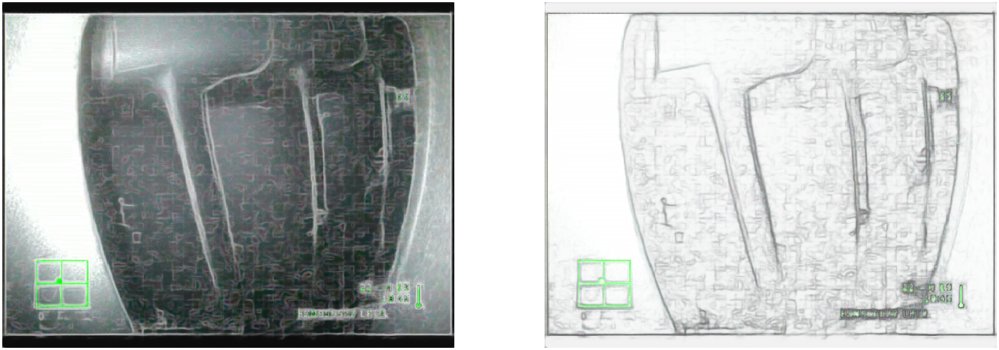

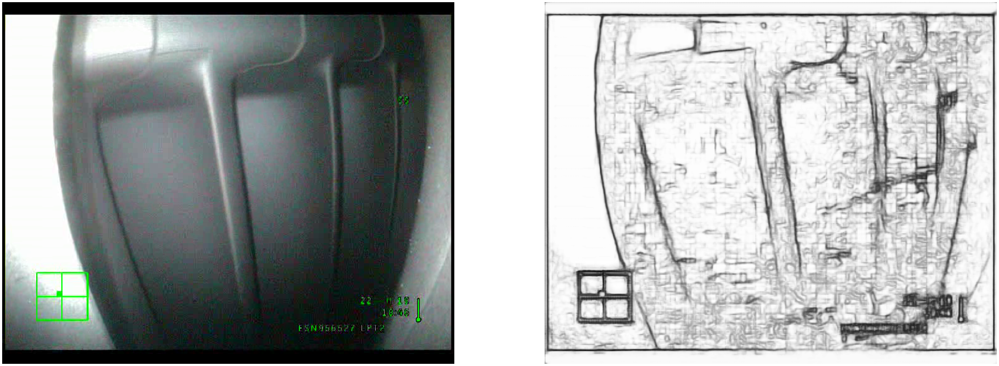

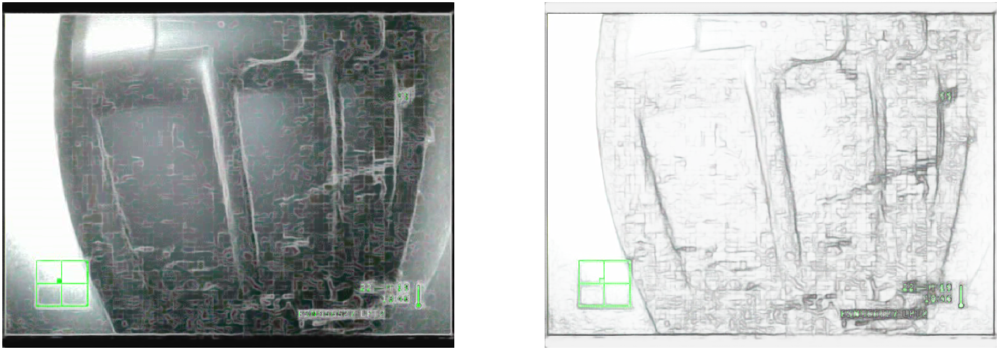

100%|██████████| 1/1 [00:09<00:00,  9.45s/it]


In [327]:
import numpy as np
from pathlib import Path
from skimage.io import imread, imsave
from tqdm import tqdm
from PIL import Image
import matplotlib.pyplot as plt
import copy
import hashlib
def merge_rgb_edge(rgb,edge):# 输入Image.open对象
    rgb = np.array(rgb.resize((752,576)))
    b_edge = np.array(edge.resize((752,576)))
    white = 255 * np.ones((576,752),dtype=np.uint8)
    w_edge = white - b_edge
    rgbe = np.zeros((576,752,4),dtype=np.uint8)
    rgbe[:, :, 0] = rgb[:, :, 0]
    rgbe[:, :, 1] = rgb[:, :, 1]
    rgbe[:, :, 2] = rgb[:, :, 2]
    rgbe[:, :, 3] = w_edge
    w_rgbe = Image.fromarray(rgbe)
    temp = copy.deepcopy(rgbe)
    temp[:, :, 3] = b_edge
    b_rgbe = Image.fromarray(temp)
    return w_edge,w_rgbe,b_rgbe 
#     return w_edge,b_edge
def showimg(img1,img2):#按一行两列的格式输出图像，适合jupyter界面
#     plt.figure(figsize=(img.shape[0]/50, img.shape[1]/50))
    plt.figure(figsize=(img.shape[0]/10, img.shape[1]/10))
    plt.subplot(1,2,1)
    plt.axis('off');plt.imshow(img1, cmap ='gray')
    plt.subplot(1,2,2)
    plt.axis('off');plt.imshow(img2, cmap ='gray')
    plt.show()
    
# focus_part = ['CC', 'HPC', 'HPT', 'HPTN', 'LPTN', 'normal_HPT', 'normal_LPT', 'part_unknown']
focus_part = ['normal_LPT']
edge_path = Path(r'/home/cver/20200702_FREEZED_DATA/ENGINE_DATA/pre_treat/DexiNed_contour')
orig_path = Path(r'/home/cver/20200702_FREEZED_DATA/ENGINE_DATA')
dst = Path(r'/home/cver/20200702_FREEZED_DATA/ENGINE_DATA/pre_treat/RGBA')

for part in tqdm(focus_part):
    edge_part = edge_path/part
    orig_part = orig_path/part
    dst_part = dst/part
    edge_img = sorted([e for e in edge_part.glob('*[!.json]')], key=lambda s: s.stem)[:3] #sort by img stem name
    orig_img = sorted([o for o in orig_part.glob('*[!.json]')], key=lambda s: s.stem)[:3]

    for e,o in zip(edge_img, orig_img):
        assert e.stem == o.stem, f'image name not match in {e} and {o}'
        edge = Image.open(e);orig = Image.open(o)
        w_edge, w_rgbe, b_rgbe = merge_rgb_edge(orig,edge)
        showimg(orig, edge)
        showimg(b_rgbe, w_rgbe)

In [212]:
import cv2

img = cv2.imread(r'/home/cver/lcx/Part_Classification/HPT/burn-BR20160016-1.png')

gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

gauss = cv2.GaussianBlur(gray, (3, 3), 1)

def doCanny(x):
    position = cv2.getTrackbarPos("CannyBar", "Canny")
    canny = cv2.Canny(gauss, position, position*2.5)
#     cv2.imshow("Canny", canny)


# cv2.namedWindow("Canny")

# cv2.createTrackbar("CannyBar", "Canny", 1, 100, doCanny)

# cv2.waitKey(0)


In [20]:
#计算给定路径下图像各个通道的均值和标准差
from pathlib import Path
from itertools import chain
from PIL import Image  
import matplotlib.pyplot as plt
import numpy as np
from imageio import imread

# filepath = '/home/cver/docker-data/maskrcnn-lcx/datasets/engine_train' # 数据集目录

filepath = Path(r'/home/cver/docker-data/maskrcnn-lcx/datasets/engine_train-CCN')
files_ = filepath.rglob('*[!.json]')
num = sum(1 for i in files_)
print(num)

# a = [i for i in path1.glob('*')];b = [i for i in path2.glob('*')]
# gene = chain(path1.glob('*'),path2.glob('*'))
# c = [i for i in gene]
# print(len(a),len(b),len(c))
# print(num)

R_channel = 0;G_channel = 0;B_channel = 0
for i in filepath.glob('*'):
    img = imread(i)
    img = clahe_in_3channels(img)
    R_channel+=img[:,:,0].mean()
    G_channel+=img[:,:,1].mean()
    B_channel+=img[:,:,2].mean()
R_mean = R_channel / num;G_mean = G_channel / num;B_mean = B_channel / num    
print("R_mean is %f, G_mean is %f, B_mean is %f" %(R_mean, G_mean, B_mean))
print(f'BGR:[{B_mean:.4f},{G_mean:.4f},{R_mean:.4f}]')

# gray = 0
# for i in filepath.rglob('*.png'):
#     img = imread(i)
# #     white = 255 * np.ones(img.shape,dtype=np.uint8)
# #     img = white - img
#     gray += img.mean()
# print(f'gray mean is {gray/num :.4f}') # white edge 25.56275262529364,black edge 229.43724737470637

1063
R_mean is 108.338050, G_mean is 106.014042, B_mean is 102.672687
BGR:[102.6727,106.0140,108.3380]


In [ ]:
R_mean is 83.503960, G_mean is 82.118760, B_mean is 77.801193

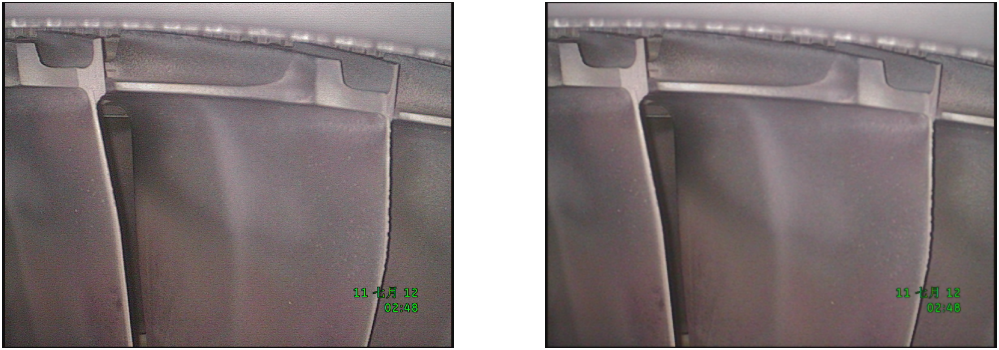

In [18]:
import PIL.Image as Image
import cv2
import numpy as np
import matplotlib.pyplot as plt
import hashlib
def showimg(img1,img2):#按一行两列的格式输出图像，适合jupyter界面
    plt.figure(figsize=(img1.shape[0]/10, img1.shape[1]/10))
    plt.subplot(1,2,1)
    plt.axis('off');plt.imshow(img1, cmap ='gray')
    plt.subplot(1,2,2)
    plt.axis('off');plt.imshow(img2, cmap ='gray')
    plt.show()
def getmd5(file_txt):
#     file_txt = open(filename,'rb').read()
    m = hashlib.md5(file_txt)
    return m.hexdigest()    
def guidedFilter(img,radius=1,sigma=10000): #向导滤波
    dst = cv2.ximgproc.guidedFilter(img,img,radius,sigma)
    return dst
path = r'/home/cver/20200702_FREEZED_DATA/ENGINE_DATA/pre_treat/GF_DN_RGBA/part_unknown/test-crack-BR2012267-6.png'
img = Image.open(path).convert('RGBA')
img_arr = np.array(img)
rgb = img_arr[:,:,:3]
gf_rgb = guidedFilter(rgb)
img_arr[:,:,:3] = gf_rgb
img1 = Image.fromarray(img_arr).convert('RGBA')
# img_arr1 = np.array(img1)
# showimg(np.array(img)[:,:,:3],img_arr1[:,:,:3])

In [176]:
a = 1
if a not in [1,4]:
    print('a')

In [227]:
a = [1,2,3]
b = [4,5,6]
for (i,j) in zip(a,b):
    print(i,j)

1 4
2 5
3 6


In [242]:
orig_path = Path(r'/home/cver/20200702_FREEZED_DATA/ENGINE_DATA.ok')
print(type(str(orig_path.with_suffix('.kjl'))))

<class 'str'>


In [387]:
import torch
import torch.nn.functional as F
import random
test = torch.rand(2,2,1,4)
print(test,test.size(),'\n')
test = F.pad(input=test, pad=(0,0,0,0,0,1), mode='constant',value = 10)
# test = F.pad(input=test, pad=(0,0,0,0,0,1), mode ='replicate')

print(test.size(),test.dtype,test,'\n')

tensor([[[[0.3133, 0.0678, 0.7839, 0.4306]],

         [[0.2096, 0.4570, 0.8929, 0.7459]]],


        [[[0.4989, 0.8080, 0.7328, 0.3416]],

         [[0.9360, 0.9964, 0.0820, 0.7447]]]]) torch.Size([2, 2, 1, 4]) 

torch.Size([2, 3, 1, 4]) torch.float32 tensor([[[[ 0.3133,  0.0678,  0.7839,  0.4306]],

         [[ 0.2096,  0.4570,  0.8929,  0.7459]],

         [[10.0000, 10.0000, 10.0000, 10.0000]]],


        [[[ 0.4989,  0.8080,  0.7328,  0.3416]],

         [[ 0.9360,  0.9964,  0.0820,  0.7447]],

         [[10.0000, 10.0000, 10.0000, 10.0000]]]]) 



In [402]:
import torch
t = torch.rand(3,3,1,4)
print(t.shape,t,t.size())
# a = t[:,2,:,:][:, np.newaxis, :, :]
# print(a.shape,a)
# b = torch.cat([t, a], 1)
# print(b.shape, b)

torch.Size([3, 3, 1, 4]) tensor([[[[0.8202, 0.3404, 0.1087, 0.0617]],

         [[0.0339, 0.3495, 0.7896, 0.2432]],

         [[0.0696, 0.0057, 0.3893, 0.6313]]],


        [[[0.2827, 0.5593, 0.1124, 0.1665]],

         [[0.4388, 0.3191, 0.4275, 0.1719]],

         [[0.6113, 0.3508, 0.2745, 0.9546]]],


        [[[0.9759, 0.4251, 0.1951, 0.9586]],

         [[0.2814, 0.1081, 0.8609, 0.7426]],

         [[0.2411, 0.1345, 0.1051, 0.1631]]]]) torch.Size([3, 3, 1, 4])


In [370]:
a = torch.tensor([3, 4, 5])
print(a.requires_grad)

False


In [362]:
import torch
mean = [3,4,5,6]
mean = torch.tensor(mean, dtype=torch.float32)
print(mean.size())
# print(mean[:, None, None])

torch.Size([4])


In [11]:
def test() -> int:    
    a = [f'192.168.1.{i}' for i in range(1,5)]
    return '0'
print(test.__annotations__)

{'return': <class 'int'>}


In [20]:
752/576*800

1044.4444444444446

In [1]:
system("jupyter" "notebook" "list")

['Currently running servers:',
 'http://0.0.0.0:8890/ :: /home/cver',
 'http://0.0.0.0:8888/ :: /home/cver']

In [3]:
print(1e-10)

1e-10


In [2]:
a = [[1],[2],[3]]
b = [['q'],['w'],['e']]
for i,j in zip(a,b):
    i.append(1)
    j.append(1)
print(a,b)

[[1, 1], [2, 1], [3, 1]] [['q', 1], ['w', 1], ['e', 1]]


In [3]:
import torch
torch.version

<module 'torch.version' from '/home/cver/anaconda3/lib/python3.7/site-packages/torch/version.py'>